# Jalon 1&2

## 1) Importation des librairies


In [ ]:
import os
import time
from tqdm import tqdm
from zipfile import ZipFile

import numpy as np
import cv2
import random
import pandas as pd
from matplotlib import pyplot as plt
import matplotlib.gridspec as gridspec
from PIL import Image
import seaborn as sns

import torch
import torchvision

from torchvision import transforms
from torch.utils.data import DataLoader
from torch.utils.data.sampler import SubsetRandomSampler

In [ ]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Using {device} for inference')

Using cuda for inference


## 2) Monture de Google Colab et décompression du dataset

CAMPUS [6, 7] (+ annotations EPFL Multi-camera Pedestrian Videos) : https://bitbucket.org/merayxu/multiview-object-tracking-dataset/src/master/
PRW [8] : http://zheng-lab.cecs.anu.edu.au/Project/project_prw.html ✅

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
with ZipFile('/content/drive/MyDrive/PRW-v16.04.20.zip', 'r') as zipObj:
  zipObj.extractall()

In [ ]:
!git clone https://bitbucket.org/merayxu/multiview-object-tracking-dataset.git

Cloning into 'multiview-object-tracking-dataset'...
Receiving objects: 100% (219/219), 1.87 GiB | 34.43 MiB/s, done.
Resolving deltas: 100% (58/58), done.
Updating files: 100% (64/64), done.


In [ ]:
import os

campus_path = 'multiview-object-tracking-dataset/CAMPUS'
files_in_campus = os.listdir(campus_path)
print(files_in_campus)

files_in_prw = os.listdir('./PRW-v16.04.20')
print(files_in_prw)

['Garden2', 'Garden1', 'Parkinglot', 'Auditorium']
['ID_train.mat', 'query_info.txt', 'frame_test.mat', 'frames', 'generate_query.m', 'annotations', 'query_box', 'frame_train.mat', 'ID_test.mat', 'readme.txt']


In [ ]:
with open('./PRW-v16.04.20/readme.txt') as f:
    contents = f.read()
    print(contents)

We provide the Person Re-identification in the Wild (PRW) dataset in this package. Please kindly cite the Arxiv paper if you use this dataset.

Liang Zheng*, Hengheng Zhang*, Shaoyan Sun*, Manmohan Chandraker, Qi Tian, "Person Re-identification in the Wild", arXiv:1604.02531, 2016. (* equal contribution)

//////////////////////////////////////////////////////////////////////

This package contains the following items.
1. Folder "frames". It contains 11,816 video frames captured by 6 cameras. For the naming rule of each frame, for example, in "c1s1_000151.jpg", "c1" refers to camera 1; "s1" refers to segment 1 in camera 1 (generated automatically during data collection); "000151" refers to the 151th frame in this segment. In addition, the train/test split is FIXED and provided by the files "frame_test.mat" and "frame_train.mat". 10-fold cross validation is NOT required.

2. Folder "annotations". It contains 11,816 MAT files in correspondence to each frame in folder "frames". All annotat

In [ ]:
print(os.listdir('multiview-object-tracking-dataset/CAMPUS/Auditorium'))
print(os.listdir('./PRW-v16.04.20/annotations'))

['view-HC4.txt', 'view-IP5.mp4', 'view-HC3.txt', 'view-IP5.txt', 'scene_metadata.xml', 'view-IP2.mp4', 'view-HC4.mp4', 'view-IP2.txt', 'cam_param.mat', 'view-HC3.mp4']
['c3s1_106667.jpg.mat', 'c4s2_026417.jpg.mat', 'c3s2_075253.jpg.mat', 'c6s1_081476.jpg.mat', 'c6s2_077043.jpg.mat', 'c2s2_113652.jpg.mat', 'c3s2_100953.jpg.mat', 'c3s1_135383.jpg.mat', 'c5s1_145670.jpg.mat', 'c5s1_046526.jpg.mat', 'c6s2_065293.jpg.mat', 'c6s2_120268.jpg.mat', 'c6s2_033768.jpg.mat', 'c1s4_012981.jpg.mat', 'c3s1_160708.jpg.mat', 'c1s3_033951.jpg.mat', 'c3s1_127933.jpg.mat', 'c5s2_111452.jpg.mat', 'c5s1_031401.jpg.mat', 'c1s2_053121.jpg.mat', 'c1s1_023226.jpg.mat', 'c6s1_085376.jpg.mat', 'c4s2_035367.jpg.mat', 'c2s2_022062.jpg.mat', 'c6s1_048051.jpg.mat', 'c6s2_093668.jpg.mat', 'c1s2_039071.jpg.mat', 'c6s2_073518.jpg.mat', 'c3s1_096292.jpg.mat', 'c1s3_063201.jpg.mat', 'c2s2_111952.jpg.mat', 'c5s2_102252.jpg.mat', 'c2s1_127516.jpg.mat', 'c2s2_010912.jpg.mat', 'c2s1_105321.jpg.mat', 'c5s2_101527.jpg.mat', 'c3

In [ ]:
import scipy.io
mat = scipy.io.loadmat('./PRW-v16.04.20/annotations/c6s2_123543.jpg.mat')
print(mat)

{'__header__': b'MATLAB 5.0 MAT-file, Platform: PCWIN64, Created on: Tue Feb 23 21:10:18 2016', '__version__': '1.0', '__globals__': [], 'box_new': array([[484.        ,  58.43488372, 108.33255814,  61.61860465,
        174.13953488],
       [920.        , 487.08604651,  64.12790698,  68.31627907,
        132.61395349],
       [921.        , 592.60126582,  86.17088608,  34.02531646,
        106.93670886],
       [922.        , 558.57594937,  82.52531646,  38.88607595,
        108.15189873]])}


In [ ]:
import scipy.io

mat = scipy.io.loadmat('./PRW-v16.04.20/annotations/c6s2_123543.jpg.mat')
print(mat['box_new'])

[[484.          58.43488372 108.33255814  61.61860465 174.13953488]
 [920.         487.08604651  64.12790698  68.31627907 132.61395349]
 [921.         592.60126582  86.17088608  34.02531646 106.93670886]
 [922.         558.57594937  82.52531646  38.88607595 108.15189873]]


In [ ]:
import pandas as pd
import os
import scipy.io

annotations_path = './PRW-v16.04.20/annotations'
images_path = './PRW-v16.04.20/frames'
all_data = []

for filename in os.listdir(annotations_path):
    if filename.endswith('.mat'):
        data = scipy.io.loadmat(os.path.join(annotations_path, filename))
        if 'box_new' in data:
            box_data = data['box_new']
            for row in box_data:
              #ajout cam,frame et chemin relatif imgs
                all_data.append([os.path.join(images_path, filename[0:-4]), filename[1], filename.split('.')[0].split('_')[1].lstrip('0'), row[0], row[1], row[2], row[3], row[4], None, None])

df_prw = pd.DataFrame(all_data, columns=['img_path', 'cam', 'frame', 'id', 'x1', 'y1', 'x2', 'y2', 'conf', 'vis'])
print(df_prw.head())

                                 img_path cam   frame     id           x1  \
0  ./PRW-v16.04.20/frames/c3s1_106667.jpg   3  106667  265.0  1369.873650   
1  ./PRW-v16.04.20/frames/c3s1_106667.jpg   3  106667  379.0   257.217063   
2  ./PRW-v16.04.20/frames/c4s2_026417.jpg   4   26417  359.0  1124.949244   
3  ./PRW-v16.04.20/frames/c3s2_075253.jpg   3   75253   -2.0  1730.197624   
4  ./PRW-v16.04.20/frames/c3s2_075253.jpg   3   75253   -2.0  1769.852052   

           y1          x2          y2  conf   vis  
0  414.538877   58.315335   95.637149  None  None  
1  374.884449  277.580994  697.451404  None  None  
2  351.558315  151.619870  440.863931  None  None  
3  412.206263   46.652268  118.963283  None  None  
4  414.538877   58.315335  130.626350  None  None  


Les ID négatifs (-2) signifient que l'identité de la personne n'est pas connue avec certitude

In [ ]:
mat = scipy.io.loadmat('./PRW-v16.04.20/frame_train.mat')
print(mat)
mat = scipy.io.loadmat('./PRW-v16.04.20/frame_test.mat')
print(mat)
mat = scipy.io.loadmat('./PRW-v16.04.20/ID_train.mat')
print(mat)
mat = scipy.io.loadmat('./PRW-v16.04.20/ID_test.mat')
print(mat)

{'__header__': b'MATLAB 5.0 MAT-file, Platform: PCWIN64, Created on: Tue Feb 23 23:27:54 2016', '__version__': '1.0', '__globals__': [], 'img_index_train': array([[array(['c1s1_000151'], dtype='<U11')],
       [array(['c1s1_000376'], dtype='<U11')],
       [array(['c1s1_000401'], dtype='<U11')],
       ...,
       [array(['c6s1_086426'], dtype='<U11')],
       [array(['c6s1_086451'], dtype='<U11')],
       [array(['c6s1_086476'], dtype='<U11')]], dtype=object)}
{'__header__': b'MATLAB 5.0 MAT-file, Platform: PCWIN64, Created on: Tue Feb 23 23:27:54 2016', '__version__': '1.0', '__globals__': [], 'img_index_test': array([[array(['c1s2_071096'], dtype='<U11')],
       [array(['c1s2_071346'], dtype='<U11')],
       [array(['c1s2_071621'], dtype='<U11')],
       ...,
       [array(['c6s2_125593'], dtype='<U11')],
       [array(['c6s2_125668'], dtype='<U11')],
       [array(['c6s2_125693'], dtype='<U11')]], dtype=object)}
{'__header__': b'MATLAB 5.0 MAT-file, Platform: PCWIN64, Created on: 

In [ ]:
with open('./multiview-object-tracking-dataset/README.md') as f:
    contents = f.read()
    print(contents)

# Multi-view Object Tracking Datasets #

For all datasets, videos in each sequence are synchronized. The groundtruth trajectories are fully annotated for all the videos in all the sequences using [Vatic](http://web.mit.edu/vondrick/vatic/). 

### Setup ###

Video sequences and groundtruth annotations for each camera view are available for download.

Each row in the annotation is organized as follows:

	track_id xmin ymin xmax ymax frame_number lost occluded generated label

	1   track_id. All rows with the same ID belong to the same path.
	2   xmin. The top left x-coordinate of the bounding box.
	3   ymin. The top left y-coordinate of the bounding box.
	4   xmax. The bottom right x-coordinate of the bounding box.
	5   ymax. The bottom right y-coordinate of the bounding box.
	6   frame_number. The frame that this annotation represents.
	7   lost. If 1, the annotation is outside of the view screen.
	8   occluded. If 1, the annotation is occluded.
	9   generated. If 1, the annotation was 

In [ ]:
df_campus = pd.read_csv('./multiview-object-tracking-dataset/CAMPUS/Auditorium/view-HC3.txt', header=None, sep=' ')
df_campus.columns = ['track_id', 'xmin', 'ymin', 'xmax', 'ymax', 'frame_number', 'lost', 'occluded', 'generated', 'label']
df_campus['cam'] = 'Auditorium view-HC3'
df_campus.head()

,track_id,xmin,ymin,xmax,ymax,frame_number,lost,occluded,generated,label,cam
0,17,408,572,496,772,0,0,0,0,PERSON,Auditorium view-HC3
1,17,408,572,496,772,1,0,0,1,PERSON,Auditorium view-HC3
2,17,412,572,500,772,2,0,0,1,PERSON,Auditorium view-HC3
3,17,416,572,504,772,3,0,0,1,PERSON,Auditorium view-HC3
4,17,420,572,504,772,4,0,0,1,PERSON,Auditorium view-HC3


In [ ]:
df_supp = pd.read_csv('./multiview-object-tracking-dataset/CAMPUS/Auditorium/view-HC4.txt', header=None, sep=' ')
df_supp.columns = ['track_id', 'xmin', 'ymin', 'xmax', 'ymax', 'frame_number', 'lost', 'occluded', 'generated', 'label']
df_supp['cam'] = 'Auditorium view-HC4'
df_supp['track_id'] += 25
df_campus = pd.concat([df_campus, df_supp], ignore_index=True)

df_supp = pd.read_csv('./multiview-object-tracking-dataset/CAMPUS/Auditorium/view-IP2.txt', header=None, sep=' ')
df_supp.columns = ['track_id', 'xmin', 'ymin', 'xmax', 'ymax', 'frame_number', 'lost', 'occluded', 'generated', 'label']
df_supp['cam'] = 'Auditorium view-IP2'
df_supp['track_id'] += 50
df_campus = pd.concat([df_campus, df_supp], ignore_index=True)

df_supp = pd.read_csv('./multiview-object-tracking-dataset/CAMPUS/Auditorium/view-IP5.txt', header=None, sep=' ')
df_supp.columns = ['track_id', 'xmin', 'ymin', 'xmax', 'ymax', 'frame_number', 'lost', 'occluded', 'generated', 'label']
df_supp['cam'] = 'Auditorium view-IP5'
df_supp['track_id'] += 75
df_campus = pd.concat([df_campus, df_supp], ignore_index=True)

df_supp = pd.read_csv('./multiview-object-tracking-dataset/CAMPUS/Garden1/view-HC2.txt', header=None, sep=' ')
df_supp.columns = ['track_id', 'xmin', 'ymin', 'xmax', 'ymax', 'frame_number', 'lost', 'occluded', 'generated', 'label']
df_supp['cam'] = 'Garden1 view-HC2'
df_supp['track_id'] += 100
df_campus = pd.concat([df_campus, df_supp], ignore_index=True)

df_supp = pd.read_csv('./multiview-object-tracking-dataset/CAMPUS/Garden1/view-HC3.txt', header=None, sep=' ')
df_supp.columns = ['track_id', 'xmin', 'ymin', 'xmax', 'ymax', 'frame_number', 'lost', 'occluded', 'generated', 'label']
df_supp['cam'] = 'Garden1 view-HC3'
df_supp['track_id'] += 125
df_campus = pd.concat([df_campus, df_supp], ignore_index=True)

df_supp = pd.read_csv('./multiview-object-tracking-dataset/CAMPUS/Garden1/view-IP1.txt', header=None, sep=' ')
df_supp.columns = ['track_id', 'xmin', 'ymin', 'xmax', 'ymax', 'frame_number', 'lost', 'occluded', 'generated', 'label']
df_supp['cam'] = 'Garden1 view-IP1'
df_supp['track_id'] += 150
df_campus = pd.concat([df_campus, df_supp], ignore_index=True)

df_supp = pd.read_csv('./multiview-object-tracking-dataset/CAMPUS/Garden1/view-Contour2.txt', header=None, sep=' ')
df_supp.columns = ['track_id', 'xmin', 'ymin', 'xmax', 'ymax', 'frame_number', 'lost', 'occluded', 'generated', 'label']
df_supp['cam'] = 'Garden1 view-Contour2'
df_supp['track_id'] += 175
df_campus = pd.concat([df_campus, df_supp], ignore_index=True)

df_supp = pd.read_csv('./multiview-object-tracking-dataset/CAMPUS/Garden2/view-HC1.txt', header=None, sep=' ')
df_supp.columns = ['track_id', 'xmin', 'ymin', 'xmax', 'ymax', 'frame_number', 'lost', 'occluded', 'generated', 'label']
df_supp['cam'] = 'Garden2 view-HC1'
df_supp['track_id'] += 200
df_campus = pd.concat([df_campus, df_supp], ignore_index=True)

df_supp = pd.read_csv('./multiview-object-tracking-dataset/CAMPUS/Garden2/view-HC2.txt', header=None, sep=' ')
df_supp.columns = ['track_id', 'xmin', 'ymin', 'xmax', 'ymax', 'frame_number', 'lost', 'occluded', 'generated', 'label']
df_supp['cam'] = 'Garden2 view-HC2'
df_supp['track_id'] += 225
df_campus = pd.concat([df_campus, df_supp], ignore_index=True)

df_supp = pd.read_csv('./multiview-object-tracking-dataset/CAMPUS/Garden2/view-HC3.txt', header=None, sep=' ')
df_supp.columns = ['track_id', 'xmin', 'ymin', 'xmax', 'ymax', 'frame_number', 'lost', 'occluded', 'generated', 'label']
df_supp['cam'] = 'Garden2 view-HC3'
df_supp['track_id'] += 250
df_campus = pd.concat([df_campus, df_supp], ignore_index=True)

df_supp = pd.read_csv('./multiview-object-tracking-dataset/CAMPUS/Garden2/view-HC4.txt', header=None, sep=' ')
df_supp.columns = ['track_id', 'xmin', 'ymin', 'xmax', 'ymax', 'frame_number', 'lost', 'occluded', 'generated', 'label']
df_supp['cam'] = 'Garden2 view-HC4'
df_supp['track_id'] += 275
df_campus = pd.concat([df_campus, df_supp], ignore_index=True)

df_supp = pd.read_csv('./multiview-object-tracking-dataset/CAMPUS/Parkinglot/view-GL1.txt', header=None, sep=' ')
df_supp.columns = ['track_id', 'xmin', 'ymin', 'xmax', 'ymax', 'frame_number', 'lost', 'occluded', 'generated', 'label']
df_supp['cam'] = 'Parkinglot view-GL1'
df_supp['track_id'] += 300
df_campus = pd.concat([df_campus, df_supp], ignore_index=True)

df_supp = pd.read_csv('./multiview-object-tracking-dataset/CAMPUS/Parkinglot/view-GL2.txt', header=None, sep=' ')
df_supp.columns = ['track_id', 'xmin', 'ymin', 'xmax', 'ymax', 'frame_number', 'lost', 'occluded', 'generated', 'label']
df_supp['cam'] = 'Parkinglot view-GL2'
df_supp['track_id'] += 325
df_campus = pd.concat([df_campus, df_supp], ignore_index=True)

df_supp = pd.read_csv('./multiview-object-tracking-dataset/CAMPUS/Parkinglot/view-GL5.txt', header=None, sep=' ')
df_supp.columns = ['track_id', 'xmin', 'ymin', 'xmax', 'ymax', 'frame_number', 'lost', 'occluded', 'generated', 'label']
df_supp['cam'] = 'Parkinglot view-GL5'
df_supp['track_id'] += 350
df_campus = pd.concat([df_campus, df_supp], ignore_index=True)

df_supp = pd.read_csv('./multiview-object-tracking-dataset/CAMPUS/Parkinglot/view-GL6.txt', header=None, sep=' ')
df_supp.columns = ['track_id', 'xmin', 'ymin', 'xmax', 'ymax', 'frame_number', 'lost', 'occluded', 'generated', 'label']
df_supp['cam'] = 'Parkinglot view-GL6'
df_supp['track_id'] += 375
df_campus = pd.concat([df_campus, df_supp], ignore_index=True)

df_campus.head()

,track_id,xmin,ymin,xmax,ymax,frame_number,lost,occluded,generated,label,cam
0,17,408,572,496,772,0,0,0,0,PERSON,Auditorium view-HC3
1,17,408,572,496,772,1,0,0,1,PERSON,Auditorium view-HC3
2,17,412,572,500,772,2,0,0,1,PERSON,Auditorium view-HC3
3,17,416,572,504,772,3,0,0,1,PERSON,Auditorium view-HC3
4,17,420,572,504,772,4,0,0,1,PERSON,Auditorium view-HC3


In [ ]:
df_campus.to_csv('CAMPUS.csv', index=False)
df_prw.to_csv('PRW.csv', index=False)

In [ ]:
#print(df_campus.head())
df_prw.head()

,img_path,cam,frame,id,x1,y1,x2,y2,conf,vis
0,./PRW-v16.04.20/frames/c3s1_106667.jpg,3,106667,265.0,1369.873650,414.538877,58.315335,95.637149,None,None
1,./PRW-v16.04.20/frames/c3s1_106667.jpg,3,106667,379.0,257.217063,374.884449,277.580994,697.451404,None,None
2,./PRW-v16.04.20/frames/c4s2_026417.jpg,4,26417,359.0,1124.949244,351.558315,151.619870,440.863931,None,None
3,./PRW-v16.04.20/frames/c3s2_075253.jpg,3,75253,-2.0,1730.197624,412.206263,46.652268,118.963283,None,None
4,./PRW-v16.04.20/frames/c3s2_075253.jpg,3,75253,-2.0,1769.852052,414.538877,58.315335,130.626350,None,None


Ici on prépare les CSV pour les structures PyTorch

In [ ]:
train_size = int(len(df_prw)*0.7)
test_size = int(len(df_prw) - train_size)

df_prw_train = df_prw.sample(n=train_size, random_state=42)
df_prw_test = df_prw.drop(df_prw_train.index)

df_prw_train.reset_index(inplace=True)
df_prw_test.reset_index(inplace=True)

df_prw_train.to_csv('PRW_train.csv', index=False)
df_prw_test.to_csv('PRW_test.csv', index=False)

In [ ]:
df_campus_filtered = df_campus[(df_campus['lost']!=1) & (df_campus['occluded']!=1)]

train_size = int(len(df_campus_filtered)*0.7)
test_size = int(len(df_campus_filtered) - train_size)

df_campus_train = df_campus_filtered.sample(n=train_size, random_state=42)
df_campus_test = df_campus_filtered.drop(df_campus_train.index)

df_campus_train.reset_index(inplace=True)
df_campus_test.reset_index(inplace=True)

df_campus_train.to_csv('CAMPUS_train.csv', index=False)
df_campus_test.to_csv('CAMPUS_test.csv', index=False)

## 3) Exploration des données

Étape 1 :
La première étape de ce jalon consiste à télécharger vos datasets.Ces derniers ont été attribués comme suit (voir documents “liens_dataset_context-aware.doc” dans le répertoire ./datasets/ du google drive) :
Groupe de Louis-Melchior (283) : CAMPUS + PRW
Ces datasets sont constitués de fichiers vidéo et d’annotations dans divers formats (.txt, .json, .csv, etc.) qu’il va vous falloir uniformiser.
Je vous demande dans un premier temps de mettre les annotations dans un dataframe pandas qu’il vous sera ensuite possible de sauvegarder au format .csv. Les dataframes doivent contenir les colonnes suivantes :
cam : l’identifiant de la caméra (ou de la vidéo);
frame : numéro de la frame;
img_path : le chemin relatif vers les images (s’il s’agit de fichiers vidéo, vous devez au préalable sauvegarder les images annotées au format .jpeg à l’aide d’une librairie python telle que OpenCV), veuillez par ailleurs à mettre chaque dataset dans un répertoire unique et à vous placer à la racine de ce dernier;
id : l’identifiant des personnes détectées;
x1 : l'abscisse du points en haut à gauche de la bounding box de la personne détectée;
y1 : l’ordonnée du points en haut à gauche de la bounding box de la personne détectée;
x2 : l'abscisse du points en bas à droite de la bounding box de la personne détectée;
y2 : l’ordonnée du points en bas à droite de la bounding box de la personne détectée;
conf : le niveau de confiance pour la personne détectée (optionnel);
vis : le seuil de visibilité de la personne détectée (optionnel);
etc. (si d’autres paramètres optionnels sont disponibles, libre à vous de les stocker dans votre dataframe ou non).
Une fois votre dataframe créé, vous pouvez les sauvegarder au format .csv dans le répertoire du dataset et passer au dataset suivant.


In [ ]:
df_prw['id'].value_counts()

-2.0      9038
 3.0       881
 1.0       635
 233.0     481
 302.0     244
          ... 
 67.0        3
 340.0       3
 59.0        3
 69.0        2
 407.0       2
Name: id, Length: 934, dtype: int64

On observe qu'il y a beaucoup trop d'indices à -2 (ceux non indentifiés), on va donc les drop pour les graphs afin de faciliter la lecture.

In [ ]:
df_prw = df_prw[df_prw['id']!=-2]

<function matplotlib.pyplot.show(close=None, block=None)>

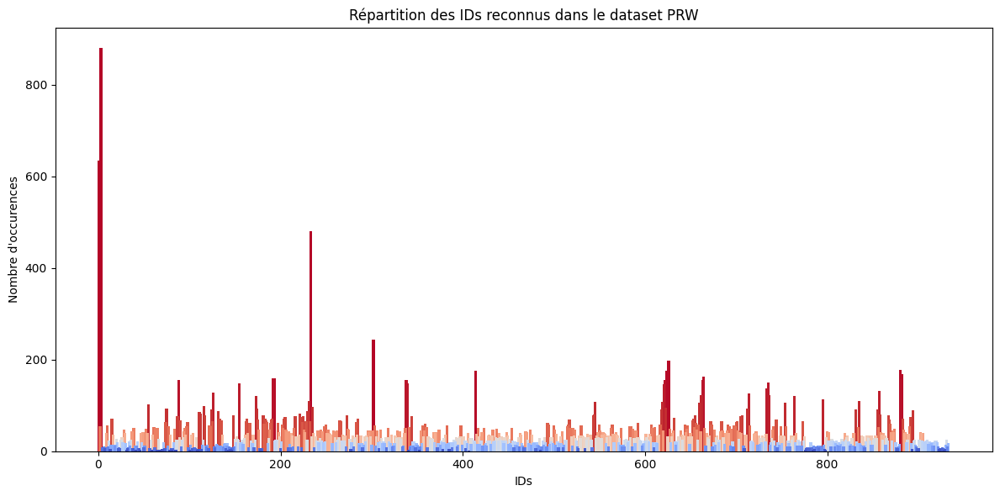

In [ ]:
df_prw_id = df_prw['id'].value_counts()

cmap = plt.get_cmap('coolwarm')
colors = cmap(np.linspace(0, 1, len(df_prw_id))[::-1])

fig = plt.figure(figsize=(12,6))
plt.bar(df_prw_id.index, df_prw_id.values, color=colors, width=3)
plt.title('Répartition des IDs reconnus dans le dataset PRW')
plt.xlabel('IDs')
plt.ylabel('Nombre d\'occurences')
plt.tight_layout()
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

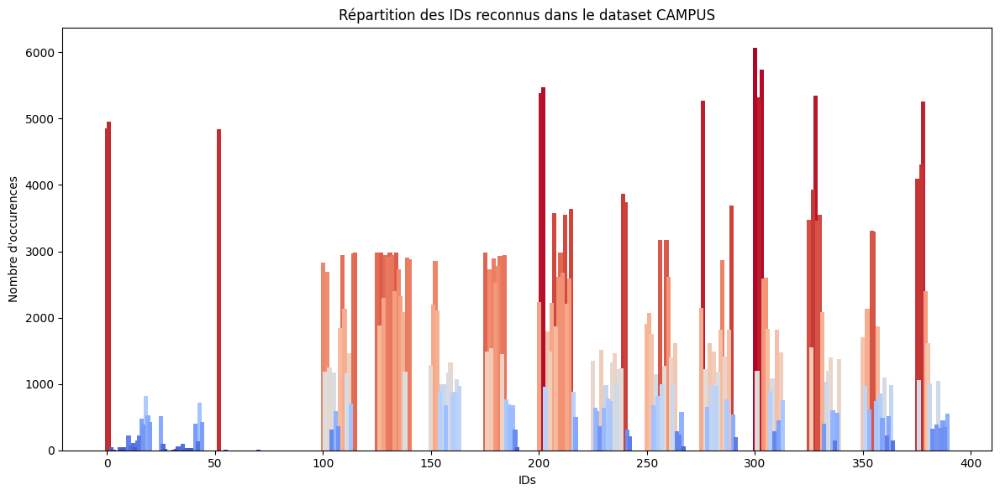

In [ ]:
df_campus_id = df_campus[(df_campus['occluded']==0) & (df_campus['lost']==0)]['track_id'].value_counts()

cmap = plt.get_cmap('coolwarm')
colors = cmap(np.linspace(0, 1, len(df_campus_id))[::-1])

fig = plt.figure(figsize=(12,6))
plt.bar(df_campus_id.index, df_campus_id.values, color=colors, width=2)
plt.title('Répartition des IDs reconnus dans le dataset CAMPUS')
plt.xlabel('IDs')
plt.ylabel('Nombre d\'occurences')
plt.tight_layout()
plt.show

Text(0.5, 1.0, 'Diagramme en boîtes de la répartition des ID en fonction des caméras de PRW')

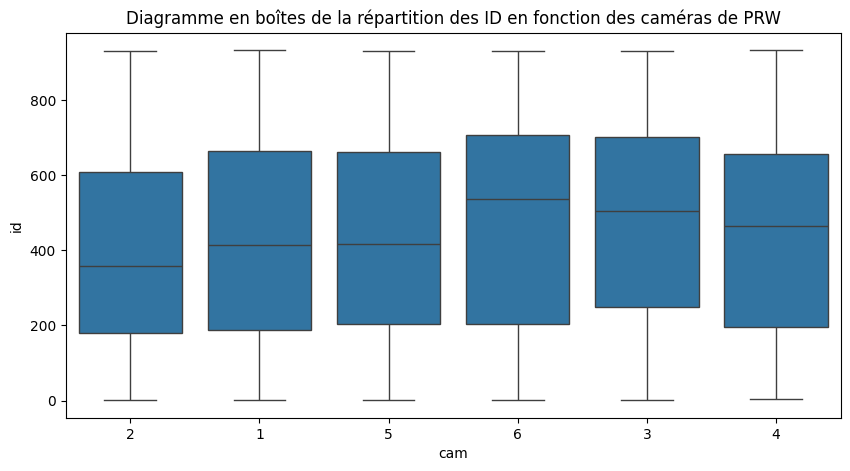

In [ ]:
fig = plt.figure(figsize=(10, 5))
sns.boxplot(data=df_prw, x='cam', y='id')
plt.title('Diagramme en boîtes de la répartition des ID en fonction des caméras de PRW')

<ipython-input-25-ed7b0295e92a>:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[row, col].set_xticklabels([cam])  # Show only one xtick label for each subplot
<ipython-input-25-ed7b0295e92a>:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[row, col].set_xticklabels([cam])  # Show only one xtick label for each subplot
<ipython-input-25-ed7b0295e92a>:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[row, col].set_xticklabels([cam])  # Show only one xtick label for each subplot
<ipython-input-25-ed7b0295e92a>:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[row, col].set_xticklabels([cam])  # Show only one xtick label for each subplot
<ipython-input-25-ed7b0295e92a>:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[row, col].set_xticklabels([cam])  # Show only one xtick label for each subplot
<ipython-input-

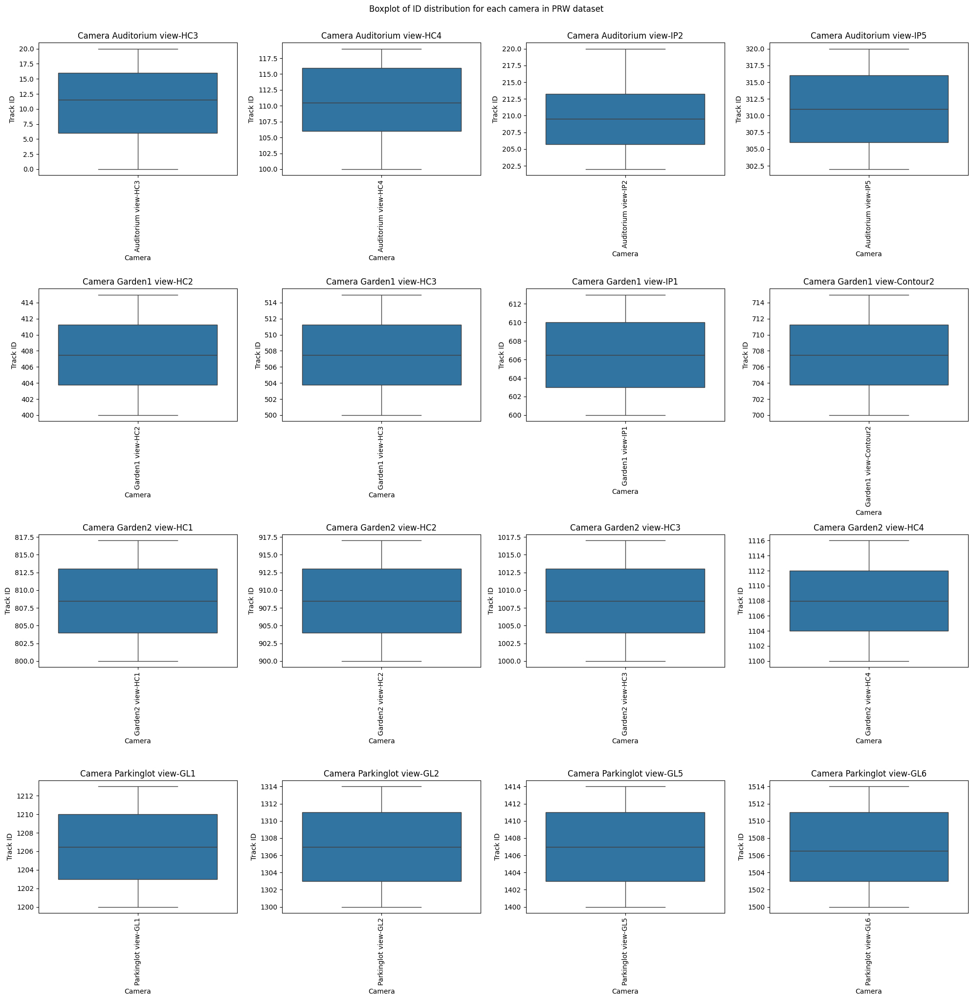

In [ ]:
fig, axes = plt.subplots(4, 4, figsize=(20, 20))  # 4x4 subplots for 16 cameras

# Iterate through unique camera values and create a boxplot for each one
for i, cam in enumerate(df_campus['cam'].unique()):
    row = i // 4  # Calculate subplot row
    col = i % 4   # Calculate subplot column

    sns.boxplot(data=df_campus[df_campus['cam'] == cam], x='cam', y='track_id', ax=axes[row, col])
    axes[row, col].set_title(f'Camera {cam}')
    axes[row, col].set_xticklabels([cam])  # Show only one xtick label for each subplot
    axes[row, col].set_xlabel('Camera')
    axes[row, col].set_ylabel('Track ID')
    axes[row, col].tick_params(axis='x', rotation=90)  # Rotate x-axis labels if needed

# Hide empty subplots if there are fewer than 16 cameras
for i in range(len(df_campus['cam'].unique()), 16):
    row = i // 4
    col = i % 4
    axes[row, col].axis('off')

plt.tight_layout()
plt.suptitle('Boxplot of ID distribution for each camera in PRW dataset', y=1.02)
plt.show()

In [ ]:
occurences = np.zeros((6, int(max(df_prw['x1'] + df_prw['x2'] + 1)), int(max(df_prw['y1'] + df_prw['y2'] + 1))))

for index, row in df_prw.iterrows():
    cam = int(row['cam'])
    x1, x2 = int(row['x1']), int(row['x2'])
    y1, y2 = int(row['y1']), int(row['y2'])

    for x in range(x1, x1+x2+1):
      for y in range(y1, y1+y2+1):
        occurences[cam-1, x, y] += 1

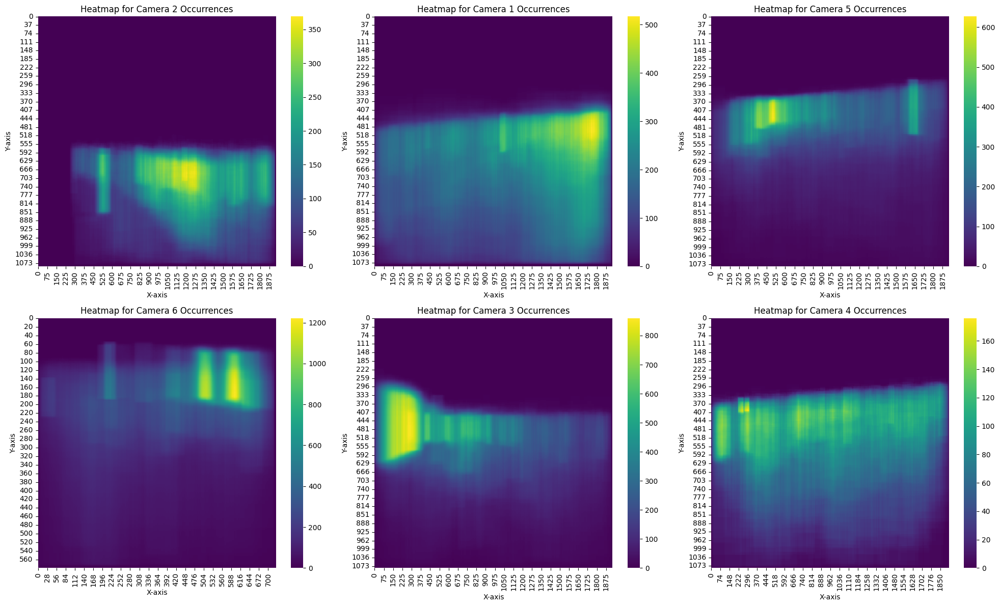

In [ ]:
fig, axes = plt.subplots(2,3,figsize=(20,12))

for i, cam in enumerate(df_prw['cam'].unique(), start=1):
    cam_occurences = occurences[int(cam) - 1]
    x2_not_null = df_prw['x2'].notnull()
    y2_not_null = df_prw['y2'].notnull()

    # Filter the DataFrame based on conditions
    filtered_df = df_prw[(x2_not_null) & (y2_not_null) & (df_prw['cam'] == cam)]

    if not filtered_df.empty:
        max_x = int(max(filtered_df['x1'] + filtered_df['x2']))
        max_y = int(max(filtered_df['y1'] + filtered_df['y2']))

    row = (i - 1) // 3
    col = (i - 1) % 3

    heatmap = sns.heatmap(cam_occurences[:max_x + 1, :max_y + 1].T, cmap='viridis', ax=axes[row, col])
    heatmap.set_title(f'Heatmap for Camera {cam} Occurrences')
    heatmap.set_xlabel('X-axis')
    heatmap.set_ylabel('Y-axis')

plt.tight_layout()
plt.show()

In [ ]:
occurences_campus = np.zeros((16, df_campus['xmax'].max()+1, df_campus['ymax'].max()+1))
used_cam = []

for index, row in df_campus.iterrows():
    if index%100==0:
      cam = row['cam']
      if cam not in used_cam:
        used_cam.append(cam)
        idx = len(used_cam) - 1
      x1, x2 = int(row['xmin']), int(row['xmax'])
      y1, y2 = int(row['ymin']), int(row['ymax'])

      for x in range(x1, x2+1):
        for y in range(y1, y2+1):
          occurences_campus[idx, x, y] += 1

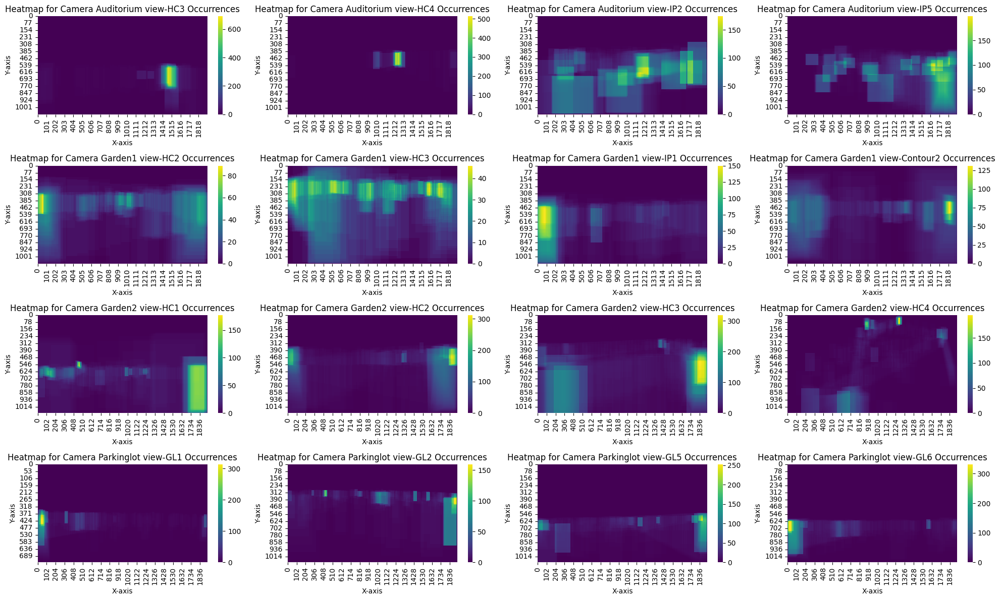

In [ ]:
fig, axes = plt.subplots(4, 4, figsize=(20, 12))

for i, cam in enumerate(df_campus['cam'].unique(), start=1):
    cam_idx = list(df_campus['cam'].unique()).index(cam)
    cam_occurences = occurences_campus[cam_idx]

    # Get min and max coordinates for the current camera
    x_max = df_campus[df_campus['cam'] == cam]['xmax'].max()
    y_max = df_campus[df_campus['cam'] == cam]['ymax'].max()

    row = (i - 1) // 4
    col = (i - 1) % 4

    heatmap = sns.heatmap(cam_occurences[:x_max+1, :y_max+1].T, cmap='viridis', ax=axes[row, col])
    heatmap.set_title(f'Heatmap for Camera {cam} Occurrences')
    heatmap.set_xlabel('X-axis')
    heatmap.set_ylabel('Y-axis')

plt.tight_layout()
plt.show()

In [ ]:
df_prw["frame"].value_counts()

18251     22
23126     20
60111     19
22351     19
61686     18
          ..
876        1
72073      1
42110      1
55307      1
120593     1
Name: frame, Length: 10612, dtype: int64

In [ ]:
df_prw["frame"].value_counts().describe()

count    10612.000000
mean         4.045326
std          2.720152
min          1.000000
25%          2.000000
50%          3.000000
75%          5.000000
max         22.000000
Name: frame, dtype: float64

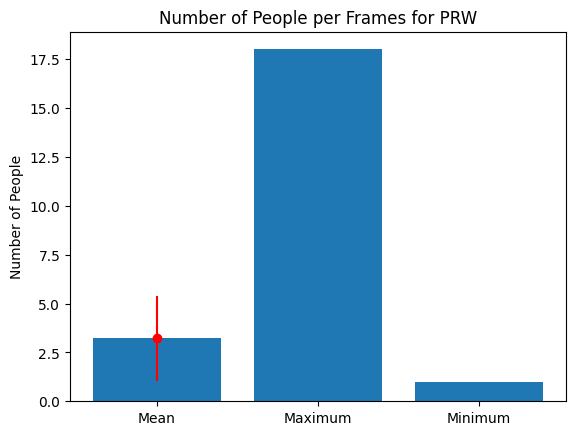

In [ ]:
mean_value = df_prw['frame'].value_counts().mean()
max_value = df_prw['frame'].value_counts().max()
min_value = df_prw['frame'].value_counts().min()

plt.bar(['Mean', 'Maximum', 'Minimum'], [mean_value, max_value, min_value])


plt.errorbar(['Mean'], [mean_value], yerr=df_prw['frame'].value_counts().std(), fmt='o', color='red')


plt.ylabel('Number of People')
plt.title('Number of People per Frames for PRW')

plt.show()

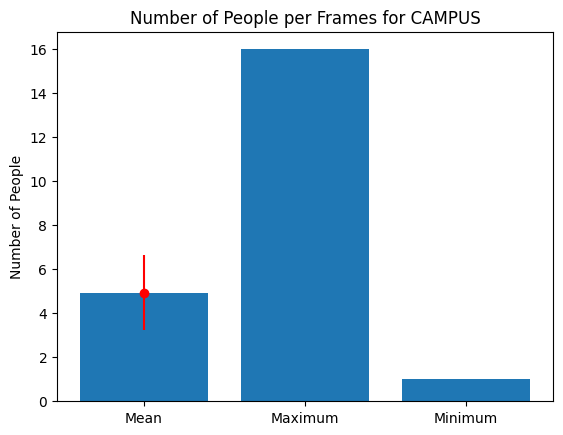

In [ ]:
mean_value = df_campus[(df_campus['lost']==0) & (df_campus['occluded']==0)][['cam','frame_number']].value_counts().mean()
max_value = df_campus[(df_campus['lost']==0) & (df_campus['occluded']==0)][['cam','frame_number']].value_counts().max()
min_value = df_campus[(df_campus['lost']==0) & (df_campus['occluded']==0)][['cam','frame_number']].value_counts().min()

plt.bar(['Mean', 'Maximum', 'Minimum'], [mean_value, max_value, min_value])

plt.errorbar(['Mean'], [mean_value], yerr=df_campus[['cam','frame_number']].value_counts().std(), fmt='o', color='red')

plt.ylabel('Number of People')
plt.title('Number of People per Frames for CAMPUS')

plt.show()

Affichage aléatoire d'une des images du dataset :

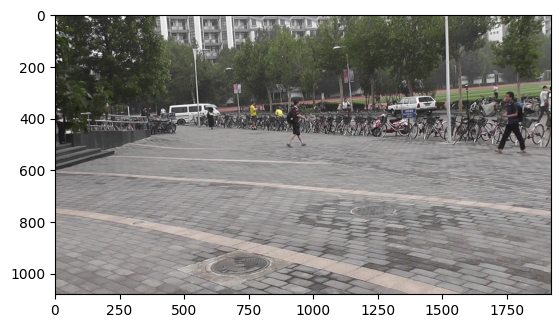

In [ ]:
idx = random.randint(0, len(df_prw) - 1)
img = cv2.imread(df_prw['img_path'][idx])
plt.imshow(img[:, :, ::-1])

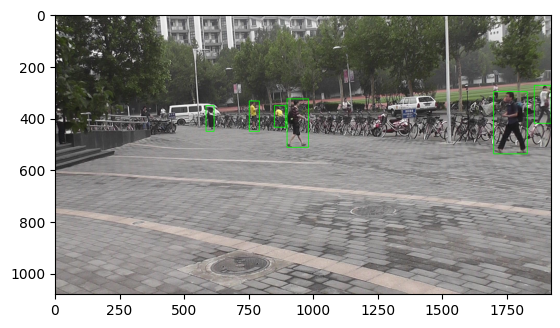

In [ ]:
img_path = df_prw.loc[idx, ['img_path']].values[0]
img = cv2.imread(df_prw['img_path'][idx])
new_df_prw = df_prw[df_prw['img_path']==img_path]
for idx, row in new_df_prw.iterrows():
  x1, y1, width, height = int(row['x1']), int(row['y1']), int(row['x2']), int(row['y2'])
  x2 = x1 + width  # Calculate x2 from x1 and width
  y2 = y1 + height  # Calculate y2 from y1 and height
  cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
plt.imshow(img[:, :, ::-1])
plt.show()

In [ ]:
df_campus[df_campus['cam']=='Auditorium view-HC3']

,track_id,xmin,ymin,xmax,ymax,frame_number,lost,occluded,generated,label,cam
0,17,408,572,496,772,0,0,0,0,PERSON,Auditorium view-HC3
1,17,408,572,496,772,1,0,0,1,PERSON,Auditorium view-HC3
2,17,412,572,500,772,2,0,0,1,PERSON,Auditorium view-HC3
3,17,416,572,504,772,3,0,0,1,PERSON,Auditorium view-HC3
4,17,420,572,504,772,4,0,0,1,PERSON,Auditorium view-HC3
...,...,...,...,...,...,...,...,...,...,...,...
98239,13,1608,544,1724,820,5453,1,0,1,PERSON,Auditorium view-HC3
98240,13,1608,544,1724,820,5454,1,0,1,PERSON,Auditorium view-HC3
98241,13,1608,544,1724,820,5455,1,0,1,PERSON,Auditorium view-HC3
98242,13,1608,544,1724,820,5456,1,0,1,PERSON,Auditorium view-HC3


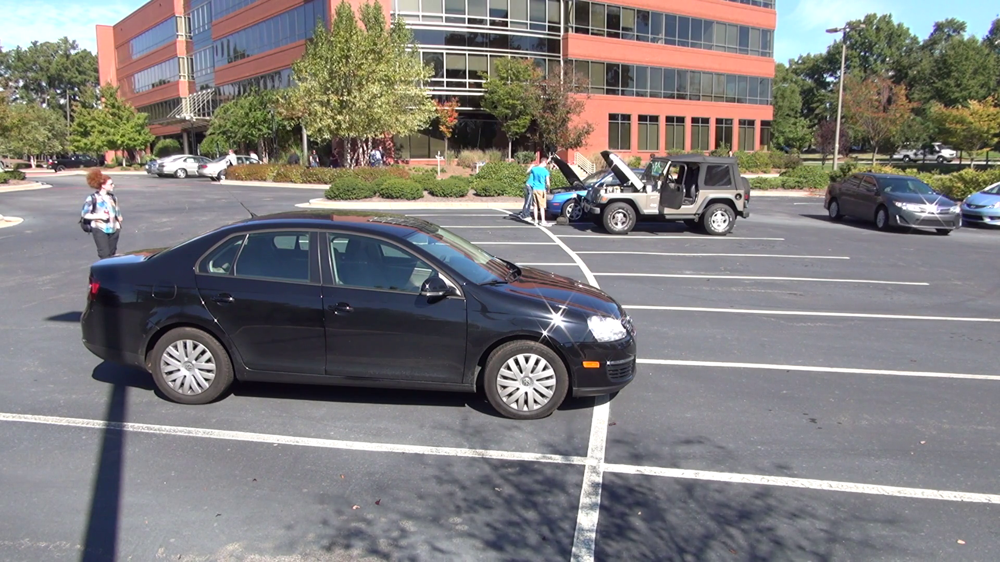

In [ ]:
from google.colab.patches import cv2_imshow

place, xcam = random.choice(list(df_campus['cam'].unique())).split(' ')
video_path = f'multiview-object-tracking-dataset/CAMPUS/{place}/{xcam}.mp4'
frame_number = random.choice(list(df_campus[df_campus['cam']==(place+' '+xcam)]['frame_number'].unique()))

cap = cv2.VideoCapture(video_path)
if not cap.isOpened():
    print("Error opening video file")
    exit()
cap.set(cv2.CAP_PROP_POS_FRAMES, frame_number)
ret, frame = cap.read()
if ret:
    cv2_imshow(frame)
    cap.release()
else:
    print("Error reading frame")

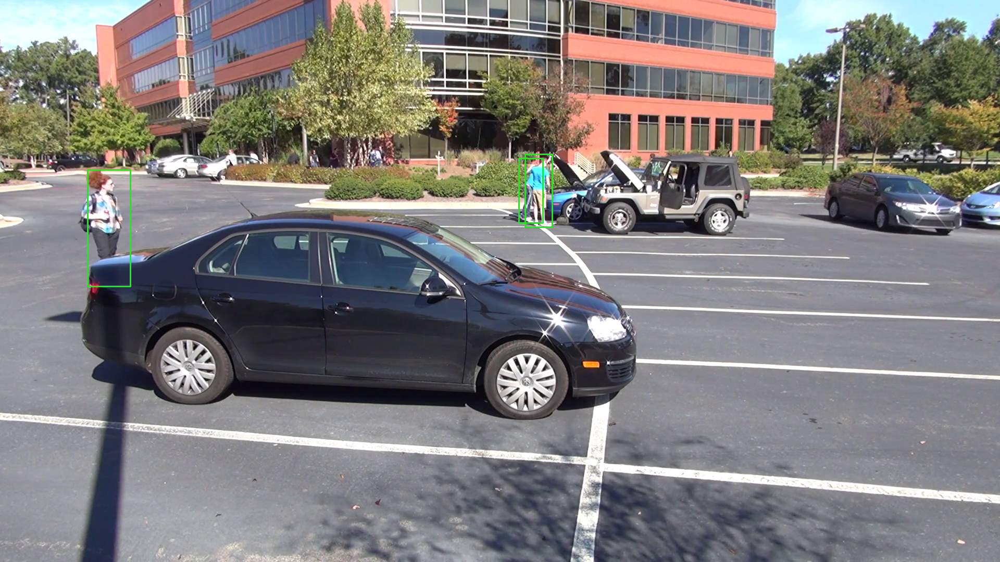

In [ ]:
cap = cv2.VideoCapture(video_path)
if not cap.isOpened():
    print("Error opening video file")
    exit()
cap.set(cv2.CAP_PROP_POS_FRAMES, frame_number)
ret, frame = cap.read()
if ret:
    for index, row in df_campus[(df_campus['cam']==(place+' '+xcam)) & (df_campus['frame_number']==frame_number) & (df_campus['lost']!=1) & (df_campus['occluded']!=1)].iterrows():
        xmin, xmax, ymin, ymax = int(row['xmin']), int(row['xmax']), int(row['ymin']), int(row['ymax'])
        cv2.rectangle(frame, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)
    cv2_imshow(frame)
    cap.release()
else:
    print("Error reading frame")

## 4) Générateur de données

#### PRW

In [ ]:
class Dataset(torch.utils.data.Dataset):
    'Characterizes a dataset for PyTorch'

    def __init__(self, csv_path, transform=None):
          'Initialization'
          self.data = pd.read_csv(csv_path)
          self.transform = transform

    def __getitem__(self, idx):
          'Generates one sample of data'
          img_path = self.data['img_path'][idx]
          X = cv2.imread(img_path)

          x1, y1, x2, y2 = int(self.data['x1'][idx]), int(self.data['y1'][idx]), int(self.data['x2'][idx]), int(self.data['y2'][idx])
          x1 = max(0, x1)
          y1 = max(0, y1)
          max_height, max_width, _ = X.shape
          x2 = min(x2, max_width - x1)
          y2 = min(y2, max_height - y1)

          try:
              X = X[y1:y1+y2, x1:x1+x2]  # Update the slicing coordinates

              if self.transform:
                  X = self.transform(X)
              y = self.data['id'][idx]
              return X, y

          except Exception as e:
              print(f"Error processing index {idx}: {e}")
              return None, None

    def __len__(self):
          'Denotes the total number of samples'
          return len(self.data)

In [ ]:
batch_size = 16
val_split = .2
input_shape = (256, 128, 3)
shuffle_dataset = True
random_seed = 42

In [ ]:
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize(input_shape[:2]),
    transforms.ToTensor(),
    #transforms.Normalize(mean=[0.375, 0.377, 0.399], std=[0.179, 0.186, 0.189])
])

In [ ]:
train_dataset = Dataset('PRW_train.csv', transform)
test_dataset = Dataset('PRW_test.csv', transform)

In [ ]:
# Creating data indices for training and validation splits :

dataset_size = len(train_dataset)
indices = list(range(dataset_size))
split = int(np.floor(val_split * dataset_size))

if shuffle_dataset :
    np.random.seed(random_seed)
    np.random.shuffle(indices)

train_indices, val_indices = indices[split:], indices[:split]

In [ ]:
# Creating data samplers and loaders :

train_sampler = SubsetRandomSampler(train_indices)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, sampler=train_sampler)

val_sampler = SubsetRandomSampler(val_indices)
val_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, sampler=val_sampler)

test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=True)

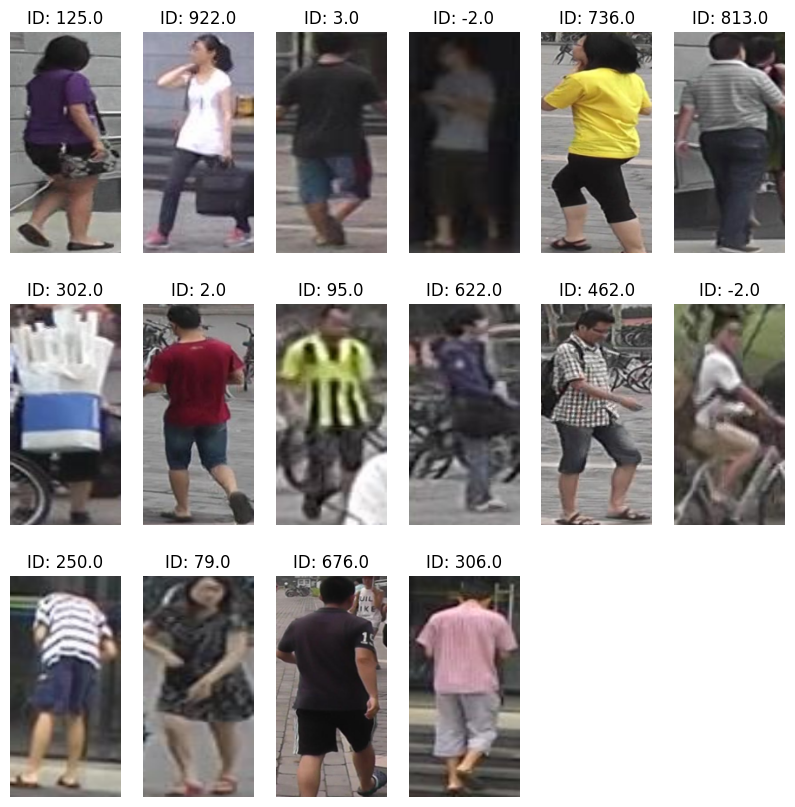

In [ ]:
fig = plt.figure(figsize=(10, 10))

for test_images, test_labels in test_loader:
    test_images = test_images.detach().numpy()
    test_labels = test_labels.detach().numpy()

    for i in range(batch_size):
        img = np.moveaxis(test_images[i], 0, -1)
        label = test_labels[i]

        fig.add_subplot((batch_size//6)+1, 6, i+1)

        plt.imshow(img[:, :, ::-1])
        plt.axis('off')
        plt.title(f'ID: {label}')

    break

#### CAMPUS

In [ ]:
class DatasetCampus(torch.utils.data.Dataset):
    'Characterizes a dataset for PyTorch'

    def __init__(self, csv_path, transform=None):
          'Initialization'
          self.data = pd.read_csv(csv_path)
          self.transform = transform

    def __getitem__(self, idx):
          'Generates one sample of data'
          place, xcam = self.data['cam'][idx].split(' ')
          video_path = f'multiview-object-tracking-dataset/CAMPUS/{place}/{xcam}.mp4'
          frame_number = self.data['frame_number'][idx]

          cap = cv2.VideoCapture(video_path)
          cap.set(cv2.CAP_PROP_POS_FRAMES, frame_number)
          ret, frame = cap.read()
          cap.release()

          xmin, ymin, xmax, ymax = int(self.data['xmin'][idx]), int(self.data['ymin'][idx]), int(self.data['xmax'][idx]), int(self.data['ymax'][idx])

          try:
            cropped_frame = frame[ymin:ymax, xmin:xmax]  # Update the slicing coordinates

            if self.transform:
                cropped_frame = self.transform(cropped_frame)

            y = self.data['track_id'][idx]
            return cropped_frame, y

          except Exception as e:
              print(f"Error processing index {idx}: {e}")
              return None, None

    def __len__(self):
          'Denotes the total number of samples'
          return len(self.data)

In [ ]:
batch_size = 16
val_split = .2
input_shape = (256, 128, 3)
shuffle_dataset = True
random_seed = 42

In [ ]:
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize(input_shape[:2]),
    transforms.ToTensor(),
    #transforms.Normalize(mean=[0.375, 0.377, 0.399], std=[0.179, 0.186, 0.189])
])

In [ ]:
train_dataset = DatasetCampus('CAMPUS_train.csv', transform)
test_dataset = DatasetCampus('CAMPUS_test.csv', transform)

In [ ]:
# Creating data indices for training and validation splits :

dataset_size = len(train_dataset)
indices = list(range(dataset_size))
split = int(np.floor(val_split * dataset_size))

if shuffle_dataset :
    np.random.seed(random_seed)
    np.random.shuffle(indices)

train_indices, val_indices = indices[split:], indices[:split]

In [ ]:
# Creating data samplers and loaders :

train_sampler = SubsetRandomSampler(train_indices)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, sampler=train_sampler)

val_sampler = SubsetRandomSampler(val_indices)
val_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, sampler=val_sampler)

test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=True)

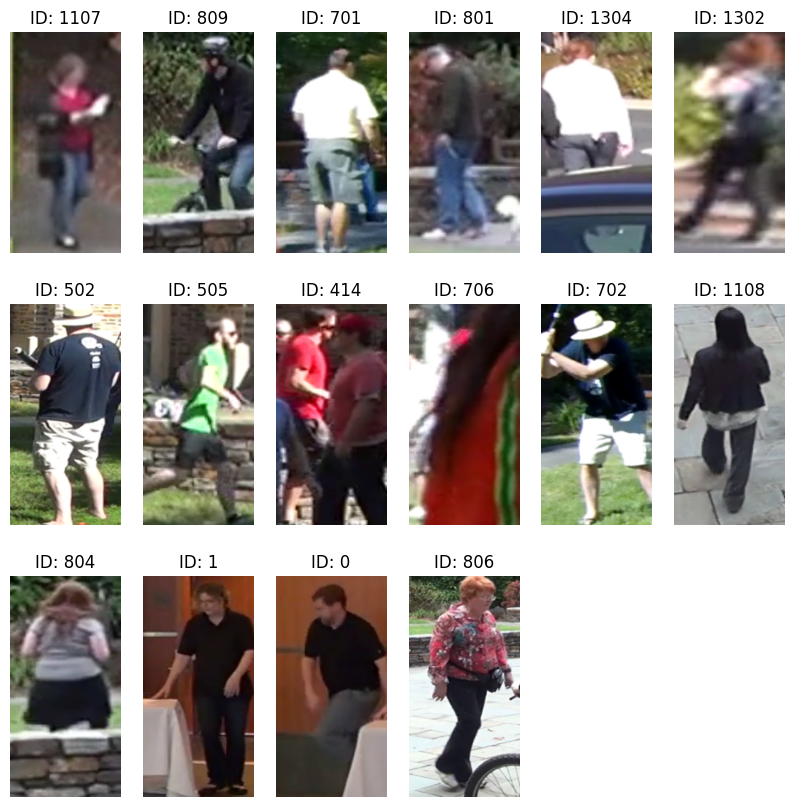

In [ ]:
fig = plt.figure(figsize=(10, 10))

for test_images, test_labels in test_loader:
    test_images = test_images.detach().numpy()
    test_labels = test_labels.detach().numpy()

    for i in range(batch_size):
        img = np.moveaxis(test_images[i], 0, -1)
        label = test_labels[i]

        fig.add_subplot((batch_size//6)+1, 6, i+1)

        plt.imshow(img[:, :, ::-1])
        plt.axis('off')
        plt.title(f'ID: {label}')

    break

# Jalon 3

## 1) Générateur de données et augmentation

In [ ]:
from sklearn.utils import shuffle

import tensorflow as tf # DL framework
from keras.preprocessing.image import ImageDataGenerator
from keras.utils import to_categorical, plot_model
from keras.layers import LeakyReLU

In [ ]:
'''
class CustomDataGen(tf.keras.utils.Sequence):
    def __init__(self, df,
                 batch_size=32,
                 input_size=(64, 128, 3),
                 shuffle=True,
                 data_augmentation=False):

        self.df = df
        self.batch_size = batch_size
        self.input_size = input_size
        self.data_augmentation = data_augmentation

        self.imageGenerator = ImageDataGenerator(
            horizontal_flip = True,
            #vertical_flip = True,
            fill_mode = 'nearest',
            zoom_range = (1, 1.1),
            width_shift_range = 0.1,
            height_shift_range = 0.1,
            rotation_range = 10
        )

        self.images = []
        self.labels = []

        for index, row in tqdm(df.iterrows()):
            image = cv2.imread(row['img_path'])
            label = row['id']

            self.images.append(image)
            self.labels.append(label)

        self.images = np.array(self.images)
        self.labels = np.array(self.labels).astype(np.float32)

        self.n = len(self.df)

        p = np.random.permutation(self.n)
        self.images = self.images[p]
        self.labels = to_categorical(self.labels[p], num_classes=934)


    def __getitem__(self, index):
        images = []

        for i in range(self.batch_size):
            image = self.images[index * self.batch_size + i]

            if self.data_augmentation:
                image = self.imageGenerator.random_transform(image)

            images.append(image)

        s = slice(self.batch_size * index, (index + 1) * self.batch_size)

        return np.array(images), (self.labels[s])


    def __len__(self):
        return self.n // self.batch_size

    def on_epoch_end(self):

        #Random permutation
        p = np.random.permutation(self.n)
        self.images = self.images[p]
        self.labels = self.labels[p]
'''

"\nclass CustomDataGen(tf.keras.utils.Sequence):\n    def __init__(self, df,\n                 batch_size=32,\n                 input_size=(64, 128, 3),\n                 shuffle=True,\n                 data_augmentation=False):\n\n        self.df = df\n        self.batch_size = batch_size\n        self.input_size = input_size\n        self.data_augmentation = data_augmentation\n\n        self.imageGenerator = ImageDataGenerator(\n            horizontal_flip = True,\n            #vertical_flip = True,\n            fill_mode = 'nearest',\n            zoom_range = (1, 1.1),\n            width_shift_range = 0.1,\n            height_shift_range = 0.1,\n            rotation_range = 10\n        )\n\n        self.images = []\n        self.labels = []\n\n        for index, row in tqdm(df.iterrows()):\n            image = cv2.imread(row['img_path'])\n            label = row['id']\n\n            self.images.append(image)\n            self.labels.append(label)\n\n        self.images = np.array(se

Test de modification du générateur de données pour réduire la ram, ajout d'un chargement paresseux des images pour ne pas les stocker dans la ram mais les utiliser que lorsque c'est necéssaire. Ajout du sclicing des bounding boxes pour uniquement prendre la personne correspondant à l'id et non toute l'image

In [ ]:
#df_prw = df_prw[df_prw['id']!=-2]

J'avais essayé de refaire le training en enlevant les IDs à -2 pour libérer de la place + ne pas train sur des données non reconnues mais j'arrive pas à lancer le train et je trouve pas pourquoi

In [ ]:
class CustomDataGen(tf.keras.utils.Sequence):
    def __init__(self, df,
                 batch_size=32,
                 input_size=(64, 128, 3),
                 shuffle=True,
                 data_augmentation=False):
        self.shuffle = shuffle
        self.df = df
        self.batch_size = batch_size
        self.input_size = input_size
        self.data_augmentation = data_augmentation

        self.imageGenerator = ImageDataGenerator(
            horizontal_flip=True,
            fill_mode='nearest',
            zoom_range=(1, 1.1),
            width_shift_range=0.1,
            height_shift_range=0.1,
            rotation_range=10
        )

        self.image_paths = df['img_path'].values
        self.labels = df['id'].values.astype(np.float32)
        self.x1_values = df['x1'].values.astype(np.int32)
        self.y1_values = df['y1'].values.astype(np.int32)
        self.x2_values = df['x2'].values.astype(np.int32)
        self.y2_values = df['y2'].values.astype(np.int32)

        self.n = len(self.df)
        self.indexes = np.arange(self.n)

        if shuffle:
            np.random.shuffle(self.indexes)

    def __getitem__(self, index):
        indexes = self.indexes[index * self.batch_size:(index + 1) * self.batch_size]

        images = []
        for i in indexes:
            image_path = self.image_paths[i]
            x1 = self.x1_values[i]
            y1 = self.y1_values[i]
            x2 = self.x2_values[i]
            y2 = self.y2_values[i]

            image = Image.open(image_path)
            image = image.crop((x1, y1, x1 + x2, y1 + y2))

            image = image.resize(self.input_size[:2])
            image = np.array(image)

            if self.data_augmentation:
                image = self.imageGenerator.random_transform(image)

            images.append(image)

        images = np.array(images)
        labels = to_categorical(self.labels[indexes], num_classes=df_prw['id'].nunique())

        return images, labels

    def __len__(self):
        return len(self.indexes) // self.batch_size

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indexes)

J'ai essayé de créer une CustomDataGen2 qui chargerait toutes les images des personnes en mémoire pour accélerer le model.fit

In [ ]:
class CustomDataGen2(tf.keras.utils.Sequence):
    def __init__(self, df,
                 batch_size=16,
                 input_size=(64, 128, 3),
                 shuffle=True,
                 data_augmentation=False):
        self.shuffle = shuffle
        self.df = df
        self.batch_size = batch_size
        self.input_size = input_size
        self.data_augmentation = data_augmentation

        self.imageGenerator = ImageDataGenerator(
            horizontal_flip=True,
            fill_mode='nearest',
            zoom_range=(1, 1.1),
            width_shift_range=0.1,
            height_shift_range=0.1,
            rotation_range=10
        )

        self.image_paths = df['img_path'].values
        self.labels = df['id'].values.astype(np.float32)
        self.x1_values = df['x1'].values.astype(np.int32)
        self.y1_values = df['y1'].values.astype(np.int32)
        self.x2_values = df['x2'].values.astype(np.int32)
        self.y2_values = df['y2'].values.astype(np.int32)

        self.n = len(self.df)
        self.indexes = np.arange(self.n)

        self.images = []
        for i in range(len(self.image_paths)):
          x1 = self.x1_values[i]
          y1 = self.y1_values[i]
          x2 = self.x2_values[i]
          y2 = self.y2_values[i]

          image = Image.open(self.image_paths[i])
          image = image.crop((x1, y1, x1 + x2, y1 + y2))
          image = image.resize(self.input_size[:2])
          image = np.array(image)
          self.images.append(image)

        self.images = np.array(self.images)

        if shuffle:
            np.random.shuffle(self.indexes)

    def __getitem__(self, index):
        images = []

        for i in range(self.batch_size):
            image = self.images[index * self.batch_size + i]

            if self.data_augmentation:
                image = self.imageGenerator.random_transform(image)

            images.append(image)

        indexes = self.indexes[index * self.batch_size:(index + 1) * self.batch_size]
        labels = to_categorical(self.labels[indexes], num_classes=df_prw['id'].nunique())

        return np.array(images), labels

    def __len__(self):
        return len(self.indexes) // self.batch_size

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indexes)

In [ ]:
df_prw['id'].nunique()

934

In [ ]:
df_prw.head()

,img_path,cam,frame,id,x1,y1,x2,y2,conf,vis
0,./PRW-v16.04.20/frames/c6s1_061001.jpg,6,61001,183.0,392.223542,65.813175,44.786177,116.941685,None,None
1,./PRW-v16.04.20/frames/c6s1_061001.jpg,6,61001,225.0,323.800216,160.361771,99.524838,391.879050,None,None
2,./PRW-v16.04.20/frames/c1s1_023276.jpg,1,23276,-2.0,1305.661987,423.869330,34.989201,90.971922,None,None
3,./PRW-v16.04.20/frames/c1s1_023276.jpg,1,23276,114.0,1507.497840,435.532397,321.900648,639.136069,None,None
4,./PRW-v16.04.20/frames/c1s1_023276.jpg,1,23276,115.0,89.268898,465.856371,186.609071,578.488121,None,None


In [ ]:
df_prw[0:5]

,img_path,cam,frame,id,x1,y1,x2,y2,conf,vis
0,./PRW-v16.04.20/frames/c6s1_061001.jpg,6,61001,183.0,392.223542,65.813175,44.786177,116.941685,None,None
1,./PRW-v16.04.20/frames/c6s1_061001.jpg,6,61001,225.0,323.800216,160.361771,99.524838,391.879050,None,None
2,./PRW-v16.04.20/frames/c1s1_023276.jpg,1,23276,-2.0,1305.661987,423.869330,34.989201,90.971922,None,None
3,./PRW-v16.04.20/frames/c1s1_023276.jpg,1,23276,114.0,1507.497840,435.532397,321.900648,639.136069,None,None
4,./PRW-v16.04.20/frames/c1s1_023276.jpg,1,23276,115.0,89.268898,465.856371,186.609071,578.488121,None,None


# TEST Cropping des images de PRW


In [ ]:
import os
from PIL import Image
import pandas as pd
from tqdm import tqdm

# Fonction pour recadrer les images
def crop_images(df):
    # Chemin du répertoire de destination
    destination_dir = 'PRW_frames_cropped'

    # Créer le répertoire s'il n'existe pas déjà
    if not os.path.exists(destination_dir):
        os.makedirs(destination_dir)

    new_df = df.copy()  # Copier le dataframe d'origine

    # Utiliser tqdm pour créer une barre de progression
    for index, row in tqdm(new_df.iterrows(), total=len(new_df), desc="Recadrage des images"):
        img_path = row['img_path']
        x1 = row['x1']
        y1 = row['y1']
        x2 = row['x2']
        y2 = row['y2']
        image_id = row['id']

        # Charger l'image
        image = Image.open(img_path)

        # Recadrer l'image
        cropped_image = image.crop((x1, y1, x1 + x2, y1 + y2))

        # Créer le nom de fichier pour l'image recadrée
        image_name = os.path.basename(img_path)
        image_name = image_name.split('.')[0]  # Retirer l'extension
        cropped_image_name = f"{image_name}_{str(image_id).split('.')[0]}.jpg"

        # Chemin de destination pour l'image recadrée
        cropped_image_path = os.path.join(destination_dir, cropped_image_name)

        # Enregistrer l'image recadrée
        cropped_image.save(cropped_image_path)

        # Mettre à jour la valeur de img_path_cropped dans le nouveau dataframe
        new_df.at[index, 'img_path'] = "./" + cropped_image_path

    return new_df

# Appeler la fonction pour recadrer les images du dataframe
df_prw_cropped = crop_images(df_prw)

Recadrage des images: 100%|██████████| 42929/42929 [07:29<00:00, 95.54it/s] 


In [ ]:
df_prw_cropped.head()

,img_path,cam,frame,id,x1,y1,x2,y2,conf,vis
0,./PRW_frames_cropped/c6s1_061001_183.jpg,6,61001,183.0,392.223542,65.813175,44.786177,116.941685,None,None
1,./PRW_frames_cropped/c6s1_061001_225.jpg,6,61001,225.0,323.800216,160.361771,99.524838,391.879050,None,None
2,./PRW_frames_cropped/c1s1_023276_-2.jpg,1,23276,-2.0,1305.661987,423.869330,34.989201,90.971922,None,None
3,./PRW_frames_cropped/c1s1_023276_114.jpg,1,23276,114.0,1507.497840,435.532397,321.900648,639.136069,None,None
4,./PRW_frames_cropped/c1s1_023276_115.jpg,1,23276,115.0,89.268898,465.856371,186.609071,578.488121,None,None


In [ ]:
df_prw_cropped['id'].nunique()

934

In [ ]:
df_prw_cropped.describe()

,id,x1,y1,x2,y2
count,42929.000000,42929.000000,42929.000000,42929.000000,42929.000000
mean,354.226933,824.204902,364.060319,78.083598,211.202543
std,304.276218,498.563909,144.290558,52.332365,128.794560
min,-2.000000,-4.035637,48.396328,18.660907,53.650108
25%,10.000000,450.823974,314.236501,44.347826,121.745455
50%,302.000000,719.139309,399.958259,60.000000,163.282937
75%,630.000000,1190.262419,433.199784,92.283044,261.252700
max,933.000000,1901.709503,883.470999,625.140389,839.740821


On supprime l'id -2 qui représente les personnes inconnues car impossible de les réidentifier.

In [ ]:
df_prw_cropped = df_prw_cropped[df_prw_cropped['id'] != -2.0]

In [ ]:
df_prw_cropped.reset_index(drop=True, inplace=True)

In [ ]:
df_prw_cropped['id'] = df_prw_cropped['id'].apply(lambda x: x - 1.0)

<ipython-input-30-63e7ead413cf>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_prw_cropped['id'] = df_prw_cropped['id'].apply(lambda x: x - 1.0)


In [ ]:
occurrences = df_prw_cropped['id'].value_counts().sort_values(ascending=False)

In [ ]:
range(len(df_prw_cropped))

range(0, 33891)

Comme vu dans les visualisations certains indices sont sur-représentés et peuvent provoquer de l'overfitting.

In [ ]:
occurrences.head(10)

2.0      881
0.0      635
232.0    481
301.0    244
625.0    197
879.0    177
623.0    175
413.0    175
881.0    169
663.0    162
Name: id, dtype: int64

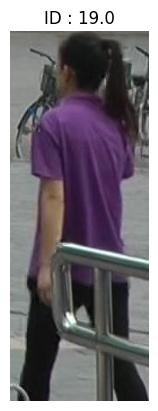

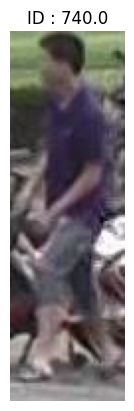

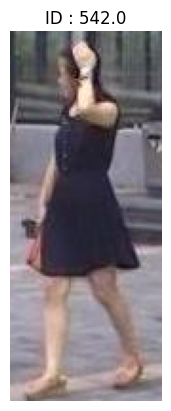

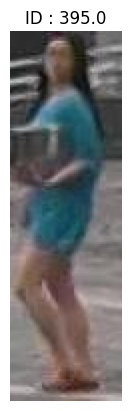

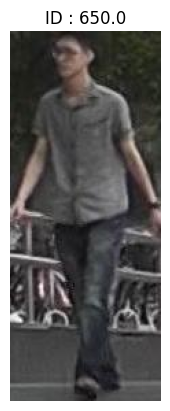

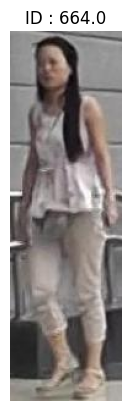

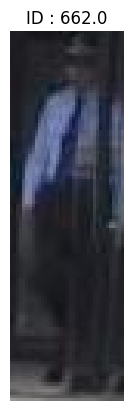

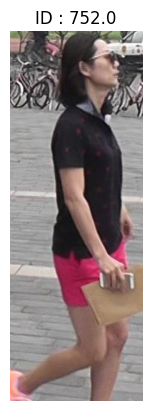

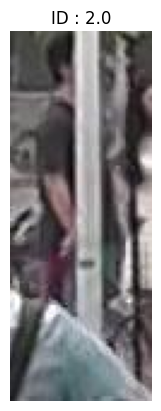

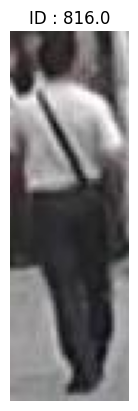

In [ ]:
import random
import matplotlib.pyplot as plt

# Fonction pour afficher les images
def display_images(df, num_images=10):
    # Sélectionner aléatoirement des lignes du dataframe
    random_indices = random.sample(range(len(df)), num_images)
    random_images = df.loc[random_indices]

    # Parcourir les images sélectionnées
    for _, row in random_images.iterrows():
        img_path = row['img_path']
        image_id = row['id']

        # Charger et afficher l'image
        image = plt.imread(img_path)
        plt.imshow(image)
        plt.title(f"ID : {image_id}")
        plt.axis('off')
        plt.show()

# Appeler la fonction pour afficher 10 images aléatoires
display_images(df_prw_cropped, num_images=10)

In [ ]:
class CustomDataGen(tf.keras.utils.Sequence):
    def __init__(self, df, batch_size=32, input_size=(64, 128, 3), shuffle=True, data_augmentation=False):
        self.df = df
        self.batch_size = batch_size
        self.input_size = input_size
        self.data_augmentation = data_augmentation
        self.num_classes = df_prw_cropped['id'].nunique()

        self.imageGenerator = ImageDataGenerator(
            horizontal_flip=True,
            fill_mode='nearest',
            zoom_range=(1, 1.1),
            width_shift_range=0.1,
            height_shift_range=0.1,
            rotation_range=10
        )

        self.images = []
        self.labels = []

        for index, row in tqdm(df.iterrows()):
            image = cv2.imread(row['img_path'])
            image = cv2.resize(image, input_size[:2])  # Redimensionner l'image à la taille spécifiée
            label = row['id']

            self.images.append(image)
            self.labels.append(label)

        self.images = np.array(self.images)
        self.labels = np.array(self.labels).astype(np.float32)

        self.n = len(self.df)

        p = np.random.permutation(self.n)
        self.images = self.images[p]
        self.labels = to_categorical(self.labels[p], num_classes=df_prw_cropped['id'].nunique())


    def __getitem__(self, index):
        images = []

        for i in range(self.batch_size):
            image = self.images[index * self.batch_size + i]

            if self.data_augmentation:
                image = self.imageGenerator.random_transform(image)

            images.append(image)

        s = slice(self.batch_size * index, (index + 1) * self.batch_size)

        return np.array(images), (self.labels[s])


    def __len__(self):

        return self.n // self.batch_size


    def on_epoch_end(self):

        #Random permutation
        p = np.random.permutation(self.n)
        self.images = self.images[p]
        self.labels = self.labels[p]


In [ ]:
#Divide into train and validation
w_train, w_val, w_test = 0.8, 0.1, 0.1

choices = random.choices(population=[0, 1, 2], weights=[w_train, w_val, w_test], k=len(df_prw_cropped))

msk_train = np.array([choice==0 for choice in choices])
msk_val = np.array([choice==1 for choice in choices])
msk_test = np.array([choice==2 for choice in choices])

train = df_prw_cropped[msk_train]
val = df_prw_cropped[msk_val]
test = df_prw_cropped[msk_test]

train_dataset = CustomDataGen(train, data_augmentation = True)
val_dataset = CustomDataGen(val)
test_dataset = CustomDataGen(test)

27150it [00:23, 1162.31it/s]
3385it [00:01, 1962.27it/s]
3356it [00:01, 1973.43it/s]


In [ ]:
from keras.applications import ResNet50, ResNet101 # cf. https://keras.io/api/applications/
from keras.layers import BatchNormalization, Activation, Flatten, Dense, Dropout, Conv2D, MaxPooling2D
from keras.regularizers import L2
from keras.initializers import random_normal

class CustomResnet50(tf.keras.Model):
    def __init__(self,
               input_shape: tuple = (128, 64, 3),
               num_classes: int = df_prw_cropped['id'].nunique(),
               base_model_trainable: bool = True
               ):

        super(CustomResnet50, self).__init__()
        self.base_model = ResNet50(include_top=False, input_shape=input_shape)
        self.base_model.trainable = base_model_trainable

        self.flatten_layer = Flatten()
        self.fc_layer = Dense(500, activation = LeakyReLU(alpha=0.3))
        self.batch_norm_layer = BatchNormalization()
        self.dropout_layer = Dropout(0.2)
        self.output_layer = Dense(num_classes, activation='softmax')

    def call(self, inputs):
        x = self.base_model(inputs)
        x = self.flatten_layer(x)
        x = self.fc_layer(x)
        x = self.batch_norm_layer(x)
        x = self.dropout_layer(x)
        return self.output_layer(x)


In [ ]:
model = CustomResnet50()
model.build(input_shape=(1, 128, 64, 3))
model.summary()

94765736/94765736 [==============================] - 0s 0us/step
Model: "custom_resnet50"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 4, 2, 2048)        23587712  
                                                                 
 flatten (Flatten)           multiple                  0         
                                                                 
 dense (Dense)               multiple                  8192500   
                                                                 
 batch_normalization (Batch  multiple                  2000      
 Normalization)                                                  
                                                                 
 dropout (Dropout)           multiple                  0         
                                                                 
 dense_1 (Dense)             multiple               

In [ ]:
EPOCHS = 50
BATCH_SIZE = 32

model.compile(
    tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss = ['categorical_crossentropy'],
    metrics = ['accuracy']
)

plateau = tf.keras.callbacks.ReduceLROnPlateau(
      monitor='val_loss', factor=0.3, patience=2, verbose = 1
)

# Early stopping (stops training when validation doesn't improve for {patience} epochs)
es = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    mode='min',
    verbose=1,
    patience=5
)

# Saves the best version of the model to disk (as measured on the validation data set)
save_best = tf.keras.callbacks.ModelCheckpoint(
    'weights.h5',
    monitor='val_loss',
    save_best_only=True,
    mode='min',
    save_weights_only = True
)

# Train
history = model.fit(
    train_dataset,
    epochs = EPOCHS,
    batch_size = BATCH_SIZE,
    validation_data = val_dataset,
    callbacks = [es, save_best, plateau]
)

Epoch 1/50
848/848 [==============================] - 143s 116ms/step - loss: 3.6718 - accuracy: 0.3095 - val_loss: 4.1254 - val_accuracy: 0.2339 - lr: 0.0010
Epoch 2/50
848/848 [==============================] - 99s 116ms/step - loss: 1.6271 - accuracy: 0.6041 - val_loss: 2.2534 - val_accuracy: 0.5101 - lr: 0.0010
Epoch 3/50
848/848 [==============================] - 98s 116ms/step - loss: 1.0761 - accuracy: 0.7231 - val_loss: 1.8168 - val_accuracy: 0.5890 - lr: 0.0010
Epoch 4/50
848/848 [==============================] - 98s 115ms/step - loss: 0.8207 - accuracy: 0.7786 - val_loss: 3.9528 - val_accuracy: 0.3637 - lr: 0.0010
Epoch 5/50
848/848 [==============================] - 98s 116ms/step - loss: 0.6685 - accuracy: 0.8173 - val_loss: 1.5358 - val_accuracy: 0.6497 - lr: 0.0010
Epoch 6/50
848/848 [==============================] - 97s 115ms/step - loss: 0.5480 - accuracy: 0.8485 - val_loss: 1.9428 - val_accuracy: 0.5902 - lr: 0.0010
Epoch 7/50
848/848 [==============================]

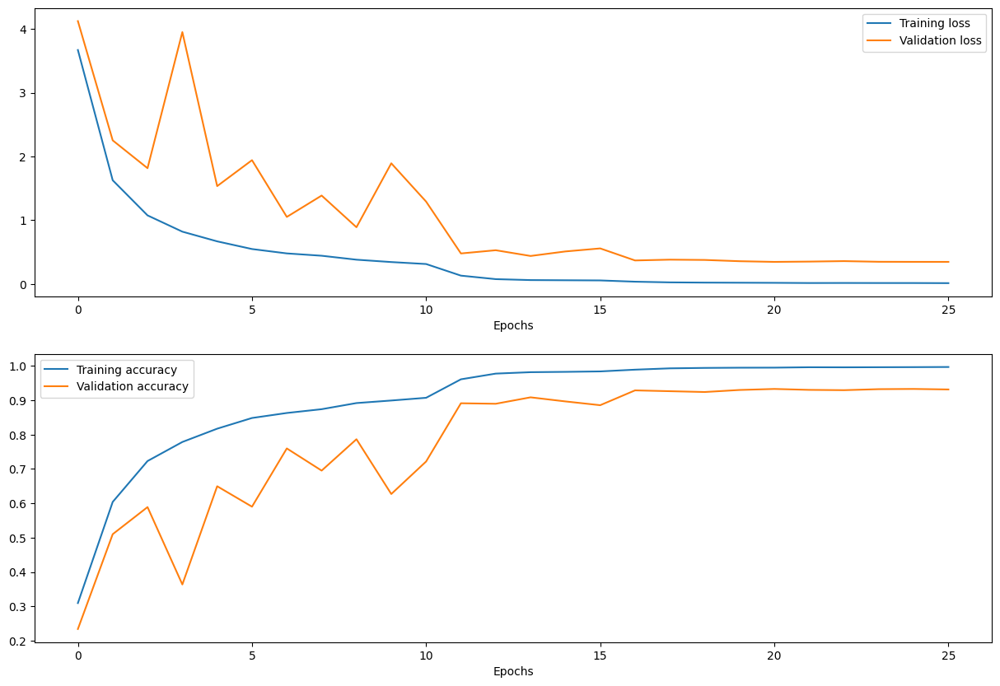

In [ ]:
def  plot_train_history(history):
    fig, axes = plt.subplots(2, 1, figsize=(15, 10))

    axes[0].plot(history.history['loss'], label='Training loss')
    axes[0].plot(history.history['val_loss'], label='Validation loss')
    axes[0].set_xlabel('Epochs')
    axes[0].legend()

    axes[1].plot(history.history['accuracy'], label='Training accuracy')
    axes[1].plot(history.history['val_accuracy'], label='Validation accuracy')
    axes[1].set_xlabel('Epochs')
    axes[1].legend()

plot_train_history(history)

In [ ]:
model.save_weights("./prw_resnet50_model.h5")

In [ ]:
#model.load_weights('weights.h5')
model.load_weights("./prw_resnet50_model.h5")
model.evaluate(test_dataset)

104/104 [==============================] - 4s 34ms/step - loss: 0.3885 - accuracy: 0.9225


[0.3884963393211365, 0.9224759340286255]

In [ ]:


idx = random.randint(0, len(test_dataset)-1)
images, labels = test_dataset[idx]
p = model.predict(images)

1/1 [==============================] - 1s 947ms/step


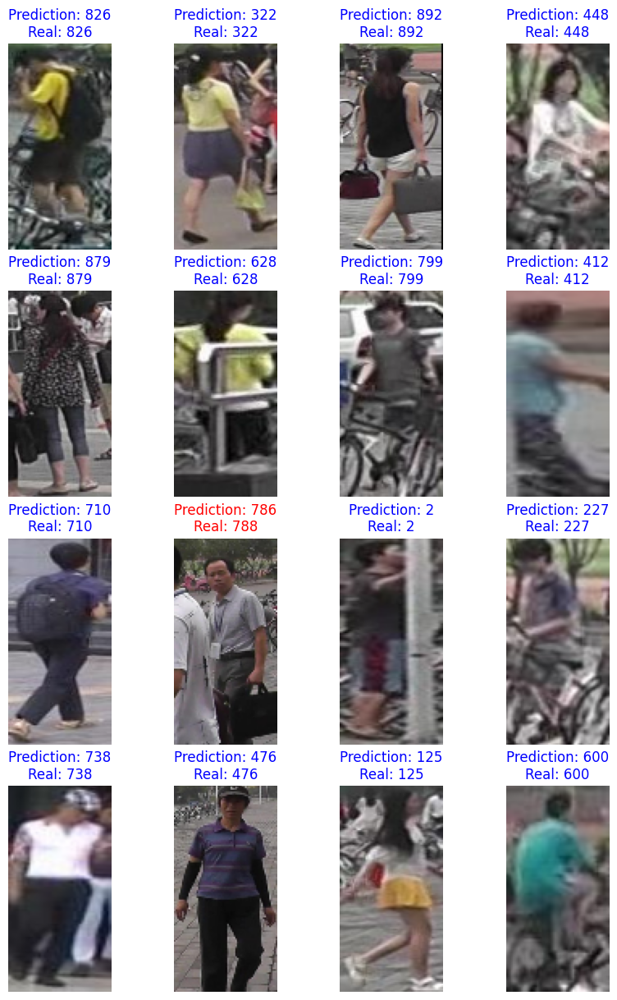

In [ ]:
fig, axes = plt.subplots(4, 4, figsize=(10, 15))

for ax in axes.ravel():
    ax.axis("off")

for i, ax in enumerate(axes.flat):
    ax = axes.flat[i]
    ax.imshow(images[i][:, :, ::-1])
    if p[i].argmax() == labels[i].argmax(): color = 'blue'
    else: color = 'red'
    ax.set_title(f'Prediction: {p[i].argmax()}\n' + f'Real: {labels[i].argmax()}', color=color)

plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, cohen_kappa_score

In [ ]:
y_test = []
y_pred = []
n = test_dataset.__len__()

for i in range(n):
  images, labels = test_dataset[i]
  p = model.predict(images)

  for j in range(BATCH_SIZE):
    y_test.append(p[j].argmax())
    y_pred.append(labels[j].argmax())

y_test = np.array(y_test)
y_pred = np.array(y_pred)

1/1 [==============================] - 0s 22ms/step


In [ ]:
print("----- Classification Report -----")
print("Misclassified samples: %d" % (y_test != y_pred).sum())
print("Accuracy: %.2f" % accuracy_score(y_test, y_pred))
print("Precision: %.2f" % precision_score(y_test, y_pred, average='macro', zero_division=0))
print("Recall: %.2f" % recall_score(y_test, y_pred, average='macro', zero_division=0))
print("F1_score: %.2f" % f1_score(y_test, y_pred, average='macro', zero_division=0))
print("Kappa: %.2f" % cohen_kappa_score(y_test, y_pred))

----- Classification Report -----
Misclassified samples: 256
Accuracy: 0.92
Precision: 0.88
Recall: 0.88
F1_score: 0.87
Kappa: 0.92


# Conclusion: Le modèle marche très bien
